In [1]:
import numpy as np
from pprint import pprint

np.random.seed(42)

from sklearn.datasets import fetch_openml
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_validate, RandomizedSearchCV, GridSearchCV, cross_val_predict
from sklearn.model_selection import learning_curve
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score, precision_score
from sklearn.metrics import make_scorer

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

In [2]:
# global settings
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
mpl.rc('figure', figsize=(8,6))

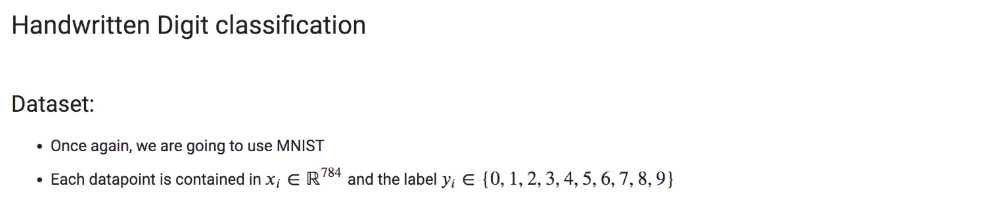

In [3]:
X, y = fetch_openml('mnist_784', version=1, return_X_y=True)

In [4]:
X = X.to_numpy()
y = y.to_numpy()

X_train, X_test, y_train, y_test = X[:60000], X[60000:], y[:60000], y[60000:]

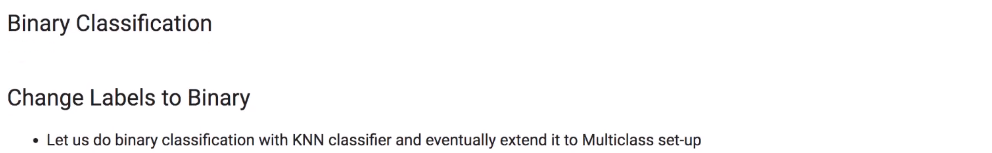

In [76]:
# initilize new variable names with all -1
y_train_0 = -1*np.ones((len(y_train)))
y_test_0 = -1*np.ones((len(y_test)))

# find indices with digit 0 image
indx_0 = np.where(y_train == '0')  # remeber original labels are of type str not int
# use those indices to modify y_train_0 and y_test_0
y_train_0[indx_0] = 1
indx_0 = np.where(y_test == '0')
y_test_0[indx_0] = 1

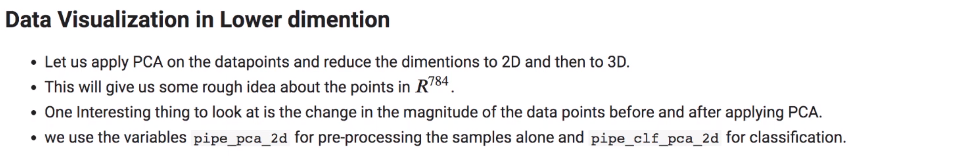

In [77]:
pipe_pca_2d = make_pipeline(MinMaxScaler(), PCA(n_components=2))
X_train_pca_2d = pipe_pca_2d.fit_transform(X_train)

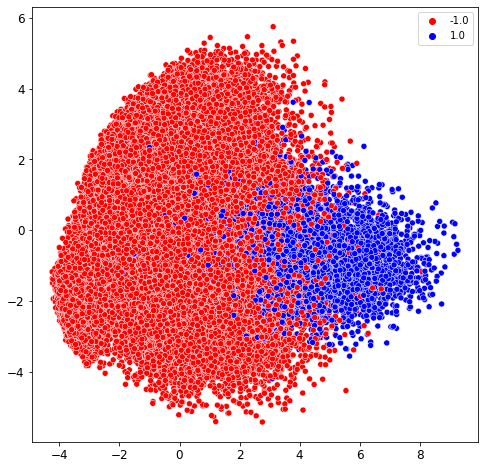

In [78]:
cmap = ListedColormap(['r', 'b'])
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_train_pca_2d[:,0], y=X_train_pca_2d[:,1], hue=y_train_0, palette=cmap)
plt.show()

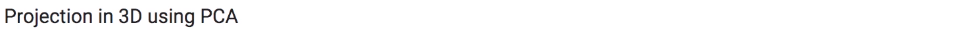

In [79]:
pipe_pca_3d = make_pipeline(MinMaxScaler(), PCA(n_components=3))
X_train_pca_3d = pipe_pca_3d.fit_transform(X_train)

In [80]:
import plotly.express as px

fig = px.scatter_3d(
    x=X_train_pca_3d[:,0],
    y=X_train_pca_3d[:,1],
    z=X_train_pca_3d[:,2],
    color=y_train_0,
    color_discrete_map=cmap,
    opacity=0.5
)
fig.show()

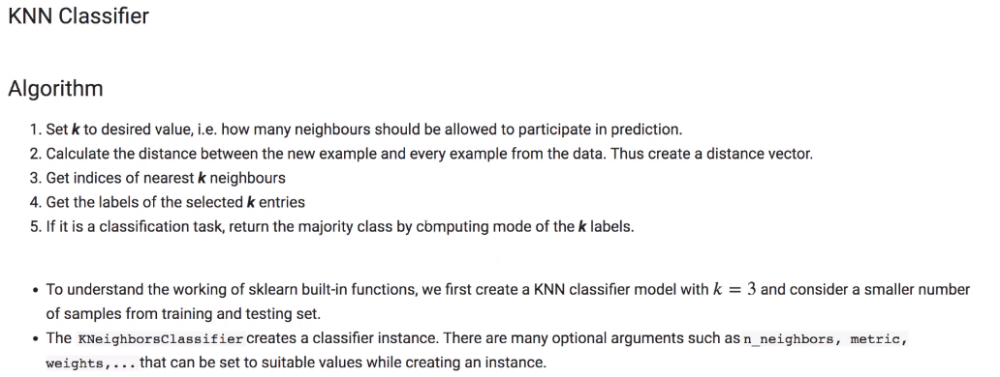

In [81]:
# create a new pipeline for classifier
pipe_clf_pca_2d = make_pipeline(pipe_pca_2d, KNeighborsClassifier(n_neighbors=3))

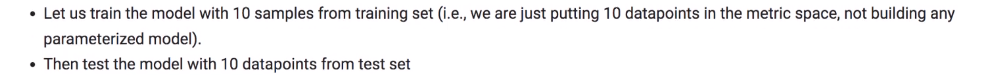

In [82]:
index_neg = np.argsort(y_train_0)[:5]  # indices of negative classes
index_pos = np.argsort(y_train_0)[-1:-6:-1]  # indices of positive classes

In [83]:
# Sanity check
# Ensure first 10 samples are mix of both classes
print('Pos classes:', y_train_0[index_pos])
print('Neg classes:', y_train_0[index_neg])

Pos classes: [1. 1. 1. 1. 1.]
Neg classes: [-1. -1. -1. -1. -1.]


In [22]:
# takeout a small dataset
x = np.vstack((X_train[index_pos,:], X_train[index_neg,:]))
y = np.hstack((y_train_0[index_pos], y_train_0[index_neg]))

print(x.shape, y.shape)

(10, 784) (10,)


In [24]:
# Fit the model with the new trainning set
pipe_clf_pca_2d.fit(x, y)

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('pca', PCA(n_components=2))])),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=3))])

In [25]:
# for visualization
x_reduced = pipe_clf_pca_2d[0].transform(x)

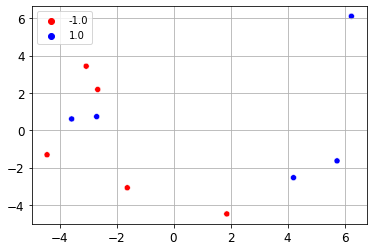

In [27]:
cmap = ListedColormap(['r', 'b'])
plt.figure(figsize=(6,4))
sns.scatterplot(x=x_reduced[:,0], y=x_reduced[:,1], hue=y, palette=cmap)
plt.grid(True)
plt.show()

Test labels: [-1. -1. -1.  1. -1. -1. -1. -1. -1. -1.]


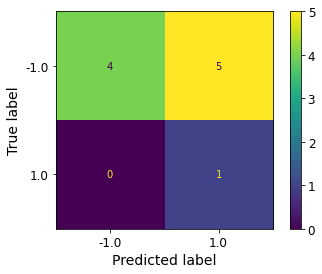

In [28]:
y_hat_0 = pipe_clf_pca_2d.predict(X_test[:10,:])
ConfusionMatrixDisplay.from_predictions(y_test_0[:10], y_hat_0)
print('Test labels:', y_test_0[:10])
plt.show()

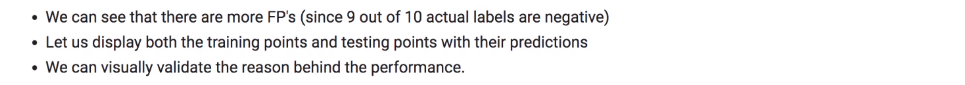

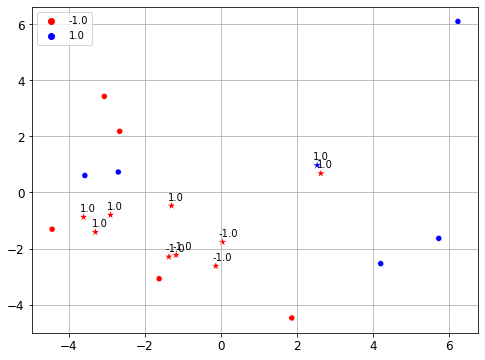

In [33]:
cmap = ListedColormap(['r', 'b'])
plt.figure(figsize=(8,6))
sns.scatterplot(x=x_reduced[:,0], y=x_reduced[:,1], marker='o', hue=y, palette=cmap)

# test points
x_test_reduced = pipe_clf_pca_2d[0].transform(X_test[:10,:])
sns.scatterplot(
    x=x_test_reduced[:,0],
    y=x_test_reduced[:,1],
    s=100,
    marker='*',
    hue=y_test_0[:10],
    palette=cmap,
    legend=None
)
# Plot the test points and annotate the points with their predictions
dx, dy = -0.1, 0.2
for i in range(10):
    plt.annotate(str(y_hat_0[i]), xy=(x_test_reduced[i,0]+dx, x_test_reduced[i,1]+dy))

plt.grid(True)
plt.show()

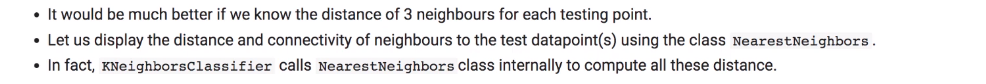

In [46]:
from sklearn.neighbors import NearestNeighbors

neighbours = NearestNeighbors(n_neighbors=3)
neighbours.fit(pipe_pca_2d.transform(x))

NearestNeighbors(n_neighbors=3)

In [47]:
dist_neighbours, idx_neighbours = neighbours.kneighbors(
    pipe_pca_2d.transform(X_test[:10]),
    3, return_distance=True
)

In [54]:
import statistics

for i in range(3):
    print('Distance: {0},\nIndex: {1},\nLabels: {2},\nPrediction: {3}'.format(
        dist_neighbours[i],
        idx_neighbours[i],
        y[idx_neighbours[i].flatten()],
        statistics.mode(y[idx_neighbours[i].flatten()])
    ))
    print('-------------------------------------------------')

Distance: [1.54510433 1.56004731 1.61914472],
Index: [1 4 6],
Labels: [ 1.  1. -1.],
Prediction: 1.0
-------------------------------------------------
Distance: [0.95703587 3.33077652 3.39001596],
Index: [7 1 6],
Labels: [-1.  1. -1.],
Prediction: -1.0
-------------------------------------------------
Distance: [1.14297879 2.0379748  2.22709669],
Index: [6 4 1],
Labels: [-1.  1.  1.],
Prediction: 1.0
-------------------------------------------------


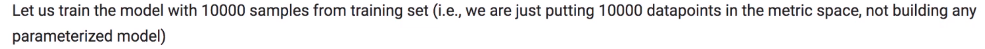

In [55]:
pipe_clf_pca_2d.fit(X_train[:10000], y_train_0[:10000])

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('pca', PCA(n_components=2))])),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=3))])

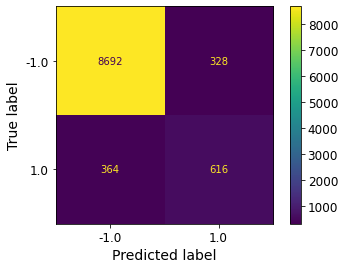

In [56]:
y_hat_0 = pipe_clf_pca_2d.predict(X_test)
ConfusionMatrixDisplay.from_predictions(y_test_0, y_hat_0)
plt.show()

In [57]:
print(classification_report(y_test_0, y_hat_0))

              precision    recall  f1-score   support

        -1.0       0.96      0.96      0.96      9020
         1.0       0.65      0.63      0.64       980

    accuracy                           0.93     10000
   macro avg       0.81      0.80      0.80     10000
weighted avg       0.93      0.93      0.93     10000



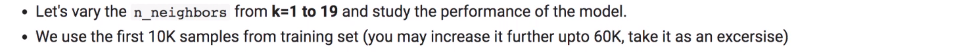

In [60]:
precision = []

for k in range(1, 20, 2):
    pipe_clf_pca_2d.__n_neighbours = k
    pipe_clf_pca_2d.fit(X_train[:10000], y_train_0[:10000])
    y_hat_0 = pipe_clf_pca_2d.predict(X_test)
    precision.append(precision_score(y_test_0, y_hat_0))

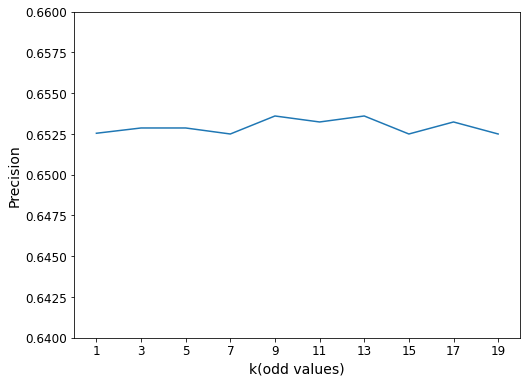

In [63]:
plt.figure(figsize=(8,6))
plt.plot(np.arange(1, 20, 2), precision)
plt.xlim(0, 20)
plt.ylim(0.64, 0.66)
plt.xlabel('k(odd values)')
plt.ylabel('Precision')
plt.xticks(ticks=np.arange(1, 20, 2), labels=np.arange(1, 20, 2))
plt.show()

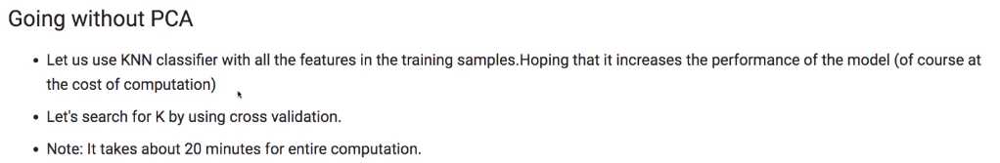

In [65]:
pipe_knn = make_pipeline(MinMaxScaler(), KNeighborsClassifier(n_neighbors=1))

In [66]:
grid_k = {'kneighborsclassifier__n_neighbors': [1, 3, 5, 7, 9, 11]}
cv = GridSearchCV(pip_knn, param_grid=grid_k, scoring='precision', cv=5)
cv.fit(X_train, y_train_0)
print(cv)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                       ('kneighborsclassifier',
                                        KNeighborsClassifier(n_neighbors=1))]),
             param_grid={'kneighborsclassifier__n_neighbors': [1, 3, 5, 7, 9,
                                                               11]},
             scoring='precision')


In [67]:
print(cv.cv_results_)

{'mean_fit_time': array([0.62463374, 0.6360023 , 0.60941396, 0.59739637, 0.60348325,
       0.6471416 ]), 'std_fit_time': array([0.02976865, 0.07342347, 0.03907841, 0.03419215, 0.04042697,
       0.04997267]), 'mean_score_time': array([15.91971636, 16.99140038, 21.55666466, 19.1707973 , 19.77544475,
       21.70195227]), 'std_score_time': array([1.09657764, 1.25658916, 1.47823754, 0.55988895, 0.45488703,
       1.29379472]), 'param_kneighborsclassifier__n_neighbors': masked_array(data=[1, 3, 5, 7, 9, 11],
             mask=[False, False, False, False, False, False],
       fill_value='?',
            dtype=object), 'params': [{'kneighborsclassifier__n_neighbors': 1}, {'kneighborsclassifier__n_neighbors': 3}, {'kneighborsclassifier__n_neighbors': 5}, {'kneighborsclassifier__n_neighbors': 7}, {'kneighborsclassifier__n_neighbors': 9}, {'kneighborsclassifier__n_neighbors': 11}], 'split0_test_score': array([0.97920133, 0.98493724, 0.98166667, 0.98086522, 0.97921862,
       0.97921862]), 'sp

In [70]:
pipe_knn = make_pipeline(MinMaxScaler(), KNeighborsClassifier(n_neighbors=7))
pipe_knn.fit(X_train, y_train_0)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=7))])

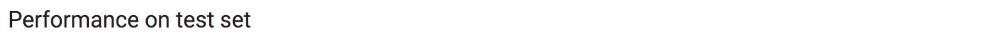

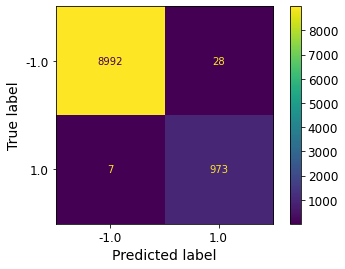

In [71]:
y_hat_0 = pipe_knn.predict(X_test)
ConfusionMatrixDisplay.from_predictions(y_test_0, y_hat_0)
plt.show()

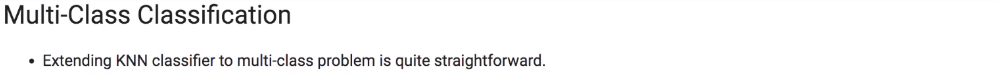

In [72]:
print(pipe_knn)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('kneighborsclassifier', KNeighborsClassifier(n_neighbors=7))])


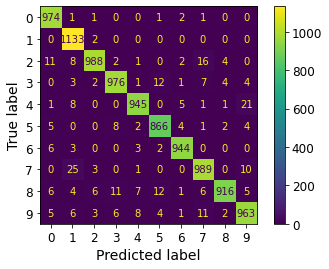

In [73]:
pipe_knn.fit(X_train, y_train)
y_hat = pipe_knn.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_hat)
plt.show()

In [74]:
pipe_knn.classes_

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], dtype=object)

In [75]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       980
           1       0.95      1.00      0.97      1135
           2       0.98      0.96      0.97      1032
           3       0.97      0.97      0.97      1010
           4       0.98      0.96      0.97       982
           5       0.97      0.97      0.97       892
           6       0.98      0.99      0.98       958
           7       0.96      0.96      0.96      1028
           8       0.99      0.94      0.96       974
           9       0.96      0.95      0.96      1009

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000

